# This is an experimental file utilizing stardist

# 0. Installation and preparation

1. Set the google runtime to GPU ("Runtime->Change runtime type" select GPU)
2. Install tensorflow (< version 2 for now)
3. Install stardist


In [2]:
!pip install stardist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 34.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 10.1 MB/s eta 0:00:00


In [3]:
import numpy as np
import sys
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, download_and_extract_zip_file, normalize

from stardist.matching import matching_dataset
from stardist import fill_label_holes, random_label_cmap, relabel_image_stardist, calculate_extents, gputools_available, _draw_polygons
from stardist.models import Config2D, StarDist2D, StarDistData2D

np.random.seed(42)
lbl_cmap = random_label_cmap()

# 1. Data

This section demonstrates how the training data for *StarDist* should look like and whether the annotated objects can be appropriately described by star-convex polygons.

The training data that needs to be provided for StarDist consists of corresponding pairs of raw images and pixelwise annotated ground truth images (masks), where every pixel has a unique integer value indicating the object id (or 0 for background).


If we want to use our own data, we would need to

1. Create a folder (e.g. "mydata") that includes the images and label masks for the training and test cases. The folder should have the following structure:

```
data
 |-mydata
 | |-train
 | | |-images
 | | | | image1.tif
 | | | | image2.tif
 | | | | ...
 | | |-masks
 | | | | mask1.tif
 | | | | mask2.tif
 | | | | ...
 | |-test
 | | |-images
 | | | | ...
 | | |-masks
 | | | | ...
 ```

2. Upload this data to your google drive

3. Mount your google drive

```
from google.colab import drive
drive.mount('/content/drive')
!ls /content/drive/My\ Drive/
```

4. Change the appropriate folder names below to the ones on your google drive.


For this demo, download the file `dsb2018.zip` that contains the respective train and test images with associated ground truth labels
They are a subset of the `stage1_train` images from the Kaggle 2018 Data Science Bowl, which are [available in full](https://data.broadinstitute.org/bbbc/BBBC038/) from the [Broad Bioimage Benchmark Collection](https://data.broadinstitute.org/bbbc/).



In [ ]:
download_and_extract_zip_file(
    url       = 'https://github.com/mpicbg-csbd/stardist/releases/download/0.1.0/dsb2018.zip',
    targetdir = 'data',
    verbose   = 1,
)

Files missing, downloading... extracting... done.


In [ ]:
!find data -type d | sed -e "s/[^-][^\/]*\// |/g" -e "s/|\([^ ]\)/|-\1/"

data
 |-dsb2018
 | |-test
 | | |-images
 | | |-masks
 | |-train
 | | |-images
 | | |-masks


In [ ]:
fX = sorted(Path('data/dsb2018/train/images/').glob('*.tif'))
fY = sorted(Path('data/dsb2018/train/masks').glob('*.tif'))
print(f"found {len(fX)} training images and {len(fY)} training masks")
assert all(Path(x).name==Path(y).name for x,y in zip(fX,fY))

found 447 training images and 447 training masks


Load only a small subset for display

In [ ]:
fX_small, fY_small = fX[:10], fY[:10]

In [ ]:
X_small = list(map(imread,map(str,fX_small)))
Y_small = list(map(imread,map(str,fY_small)))

# Software we can utilize for creating labeled data to train our model on
---


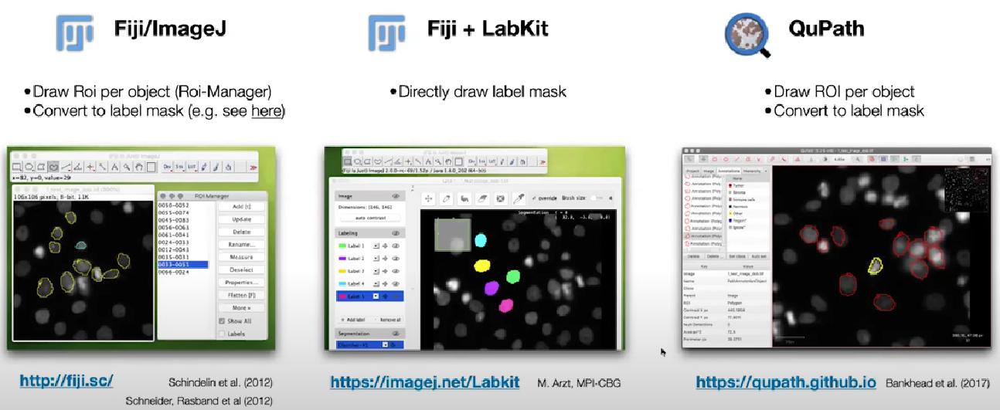

## Example image

In [ ]:
i = min(4, len(X_small)-1)
img, lbl = X_small[i], fill_label_holes(Y_small[i])
assert img.ndim in (2,3)
img = img if img.ndim==2 else img[...,:3]
# assumed axes ordering of img and lbl is: YX(C)

# **NOTE: Displays a "mask" images which represents the annotations (labels) we need to create for the Ground Truth labels**
- **Here every cell has a distinct label**
- **We would need to label each region in the contrast image**
---



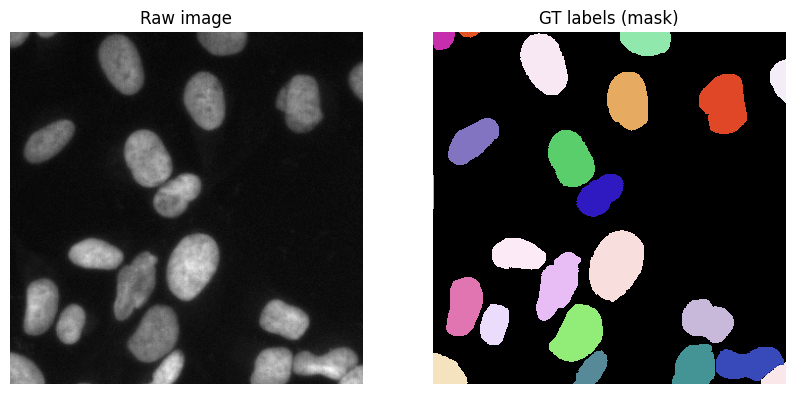

In [ ]:
plt.figure(figsize=(10,8))
plt.subplot(121); plt.imshow(img,cmap='gray');   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('GT labels (mask)')
None;

# **Now we need to see how well our shapes in our image can be represented as a star-convex polygons below.**
- This is basically a base case.
---




## Fitting ground-truth labels with star-convex polygons

In [ ]:
n_rays = [2**i for i in range(2,8)]
print(n_rays)

[4, 8, 16, 32, 64, 128]


### Example image reconstructed with various number of rays

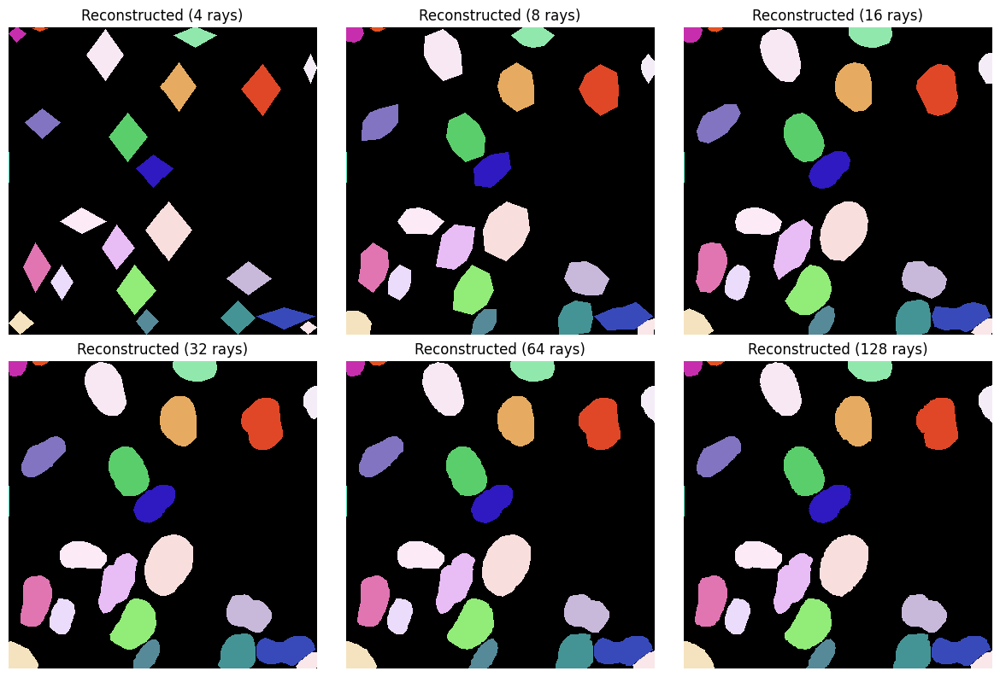

In [ ]:
fig, ax = plt.subplots(2,3, figsize=(12,8))
for a,r in zip(ax.flat,n_rays):
    a.imshow(relabel_image_stardist(lbl, n_rays=r), cmap=lbl_cmap, interpolation="nearest")
    a.set_title('Reconstructed (%d rays)' % r)
    a.axis('off')
plt.tight_layout();

# **Mean IoU for different number of rays**

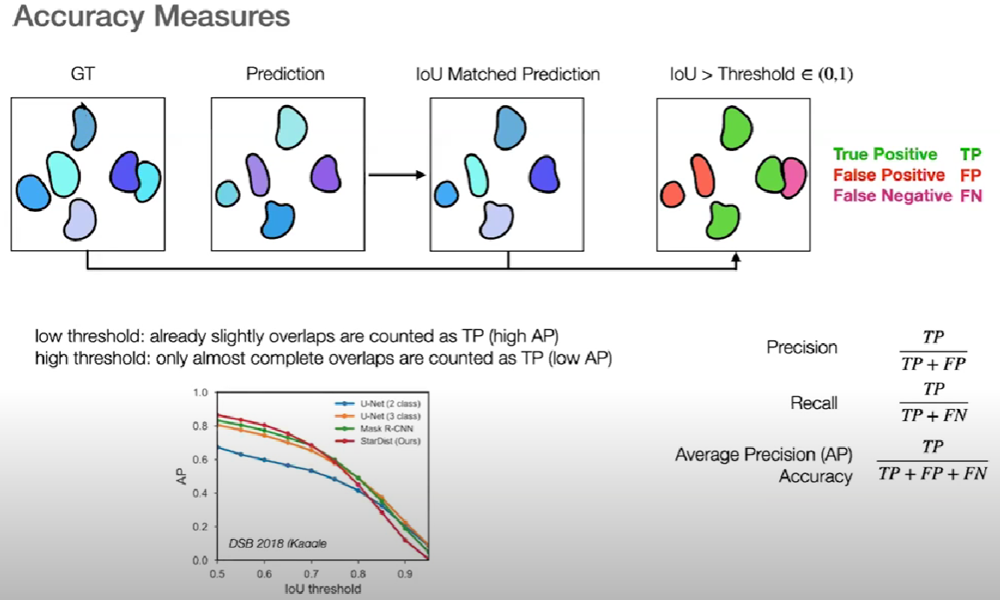

# **Important: This metric shows how well our labled regions are represented as star-convex polygons.**
- **If not close to one then no need in training because it would be useless....**

In [ ]:
scores = []
for r in tqdm(n_rays):
    Y_reconstructed = [relabel_image_stardist(lbl, n_rays=r) for lbl in Y_small]
    mean_iou = matching_dataset(Y_small, Y_reconstructed, thresh=0, show_progress=False).mean_true_score
    scores.append(mean_iou)

100%|██████████| 6/6 [00:10<00:00,  1.68s/it]


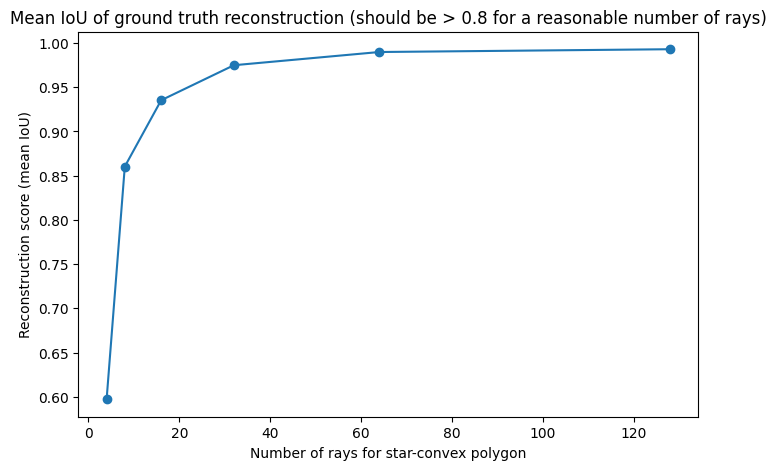

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(n_rays, scores, 'o-')
plt.xlabel('Number of rays for star-convex polygon')
plt.ylabel('Reconstruction score (mean IoU)')
plt.title("Mean IoU of ground truth reconstruction (should be > 0.8 for a reasonable number of rays)")
None;

# 2. Training


Training data (for input `X` with associated label masks `Y`) can be provided via lists of numpy arrays, where each image can have a different size. Alternatively, a single numpy array can also be used if all images have the same size.  
Input images can either be two-dimensional (single-channel) or three-dimensional (multi-channel) arrays, where the channel axis comes last. Label images need to be integer-valued.

# **Our Data (Images & Masks) need to follow these guidelines**
---


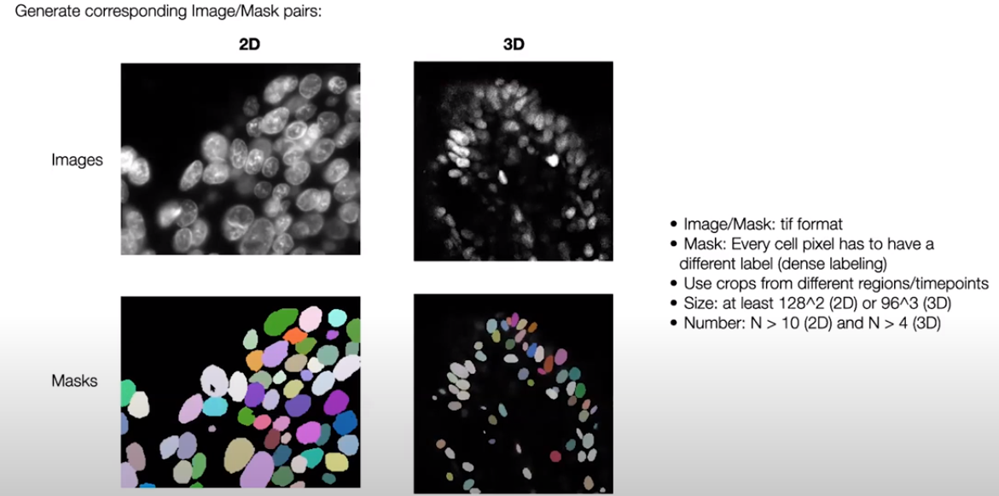

In [ ]:
fX = sorted(Path('data/dsb2018/train/images/').glob('*.tif'))
fY = sorted(Path('data/dsb2018/train/masks').glob('*.tif'))
assert all(Path(x).name==Path(y).name for x,y in zip(fX,fY))
print(f"{len(fX)} files found")

447 files found


In [ ]:
X = list(map(imread,map(str,tqdm(fX))))
Y = list(map(imread,map(str,tqdm(fY))))
n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]

100%|██████████| 447/447 [00:00<00:00, 1178.50it/s]


Normalize images and fill small label holes.

In [ ]:
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    sys.stdout.flush()

X = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X)]
Y = [fill_label_holes(y) for y in tqdm(Y)]

100%|██████████| 447/447 [00:02<00:00, 186.72it/s]


Split into train and validation datasets.

In [ ]:
assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]
X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train]
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))

number of images: 447
- training:       380
- validation:      67


Training data consists of pairs of input image and label instances.

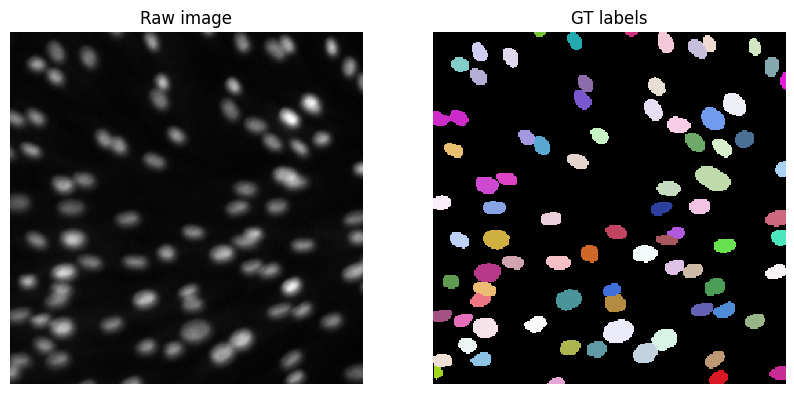

In [ ]:
i = min(9, len(X)-1)
img, lbl = X[i], Y[i]
assert img.ndim in (2,3)
img = img if img.ndim==2 else img[...,:3]
plt.figure(figsize=(10,8))
plt.subplot(121); plt.imshow(img,cmap='gray');   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('GT labels')
None;

## Configuration

A `StarDist2D` model is specified via a `Config2D` object.

In [ ]:
print(Config2D.__doc__)

In [ ]:
conf = Config2D (
    n_rays       = 32,
    grid         = (2,2), # Dense output or is it enough to just smaple every "Second".
                          # Subsampling factors (must be powers of 2) for each of the axes.
                          #  Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_channel_in = 1,
)
print(conf)
vars(conf)

**Note:** The trained `StarDist2D` model will *not* predict completed shapes for partially visible objects at the image boundary if `train_shape_completion=False` (which is the default option).

In [ ]:
model = StarDist2D(conf, name='stardist', basedir='models')

Using default values: prob_thresh=0.5, nms_thresh=0.4.


Check if the neural network has a large enough field of view to see up to the boundary of most objects.

# Note: Every nueral network has a receptive field. Must make sure that the boundary is big enough to encasulate each region (in this example each nuclei).
- **Since our regions will be relatively large in some instances we may have to toggle this a bit to find a good balance**
- **What I mean by the above is, we may need to downscale our images or make the field of view of the network larger**
---



In [ ]:
median_size = calculate_extents(list(Y), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
if any(median_size > fov):
    print("WARNING: median object size larger than field of view of the neural network.")
else:
    print("All good! (object sizes fit into field of view of the neural network)")


All good! (object sizes fit into field of view of the neural network)


## Pretrained Models

The following command can be used to show a list of available pretrained models:

In [ ]:
StarDist2D.from_pretrained()

There are 4 registered models for 'StarDist2D':

Name                  Alias(es)
────                  ─────────
'2D_versatile_fluo'   'Versatile (fluorescent nuclei)'
'2D_versatile_he'     'Versatile (H&E nuclei)'
'2D_paper_dsb2018'    'DSB 2018 (from StarDist 2D paper)'
'2D_demo'             None


## Augmentation

# Note: We may want to introduce other artifacts in our images
- **This may be due to the fact their are many stripes ect, in our images, to make sure the labeled regions are correctly segemented even when these artifacts are present.**
---




You can define a function/callable that applies augmentation to each batch of the data generator.  
We here use an `augmenter` that applies random rotations, flips, and intensity changes, which are typically sensible for (2D) microscopy images:

In [ ]:
def random_fliprot(img, mask):
    axes = tuple(range(img.ndim))
    perm = np.random.permutation(axes)
    img = img.transpose(perm)
    mask = mask.transpose(perm)
    for ax in axes:
        if np.random.rand()>.5:
            img = np.flip(img,axis = ax)
            mask = np.flip(mask,axis = ax)
    return img, mask

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,2) + np.random.uniform(-.2,.2)
    return img

def augmenter(img,mask):
    """Augmentation for image,mask"""
    img, mask = random_fliprot(img, mask)
    img = random_intensity_change(img)
    return img, mask

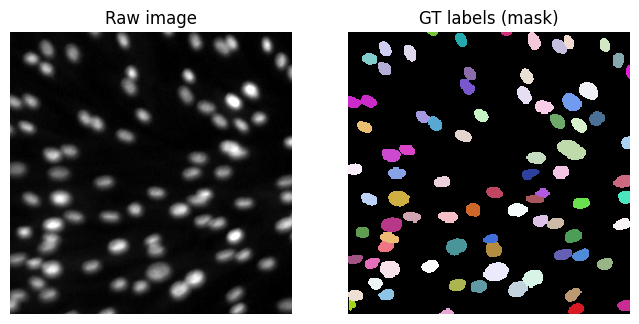

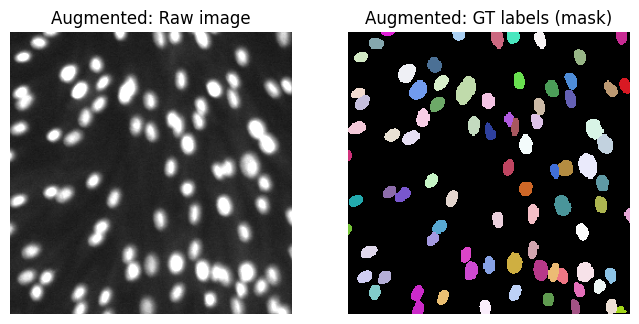

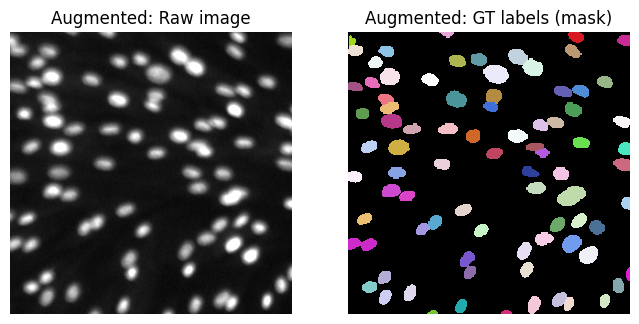

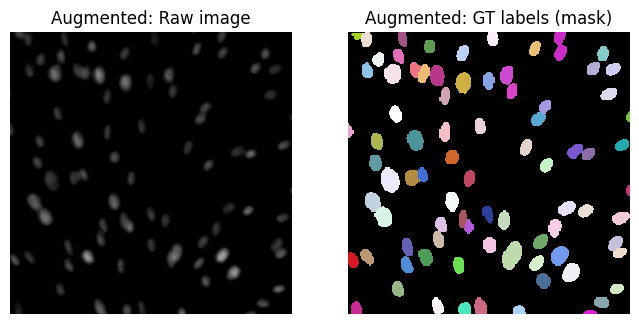

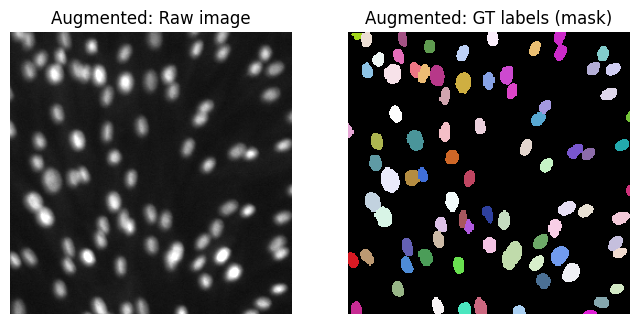

In [ ]:
plt.figure(figsize=(8,5))
plt.subplot(121); plt.imshow(img,cmap='gray', clim = (0,1));   plt.axis('off'); plt.title('Raw image')
plt.subplot(122); plt.imshow(lbl,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('GT labels (mask)')

for _ in range(4):
    plt.figure(figsize=(8,5))
    x,y = augmenter(img, lbl)
    plt.subplot(121); plt.imshow(x,cmap='gray', clim = (0,1));   plt.axis('off'); plt.title('Augmented: Raw image')
    plt.subplot(122); plt.imshow(y,cmap=lbl_cmap, interpolation="nearest"); plt.axis('off'); plt.title('Augmented: GT labels (mask)')
None;

## Model Training

We recommend to monitor the progress during training with [TensorBoard](https://www.tensorflow.org/programmers_guide/summaries_and_tensorboard).

In [ ]:
!rm -rf logs

# Tensorboard is awesome!!!
-**Can check intermediate results as you progress with the training in the net images, even by scrolling through different epochs. Super cool man!**
- **Remeber we are predicting 2 things!**
  - The probablity that it is the center of the region
  - The Distance map

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=. --port 6008

Reusing TensorBoard on port 6008 (pid 17926), started 0:33:41 ago. (Use '!kill 17926' to kill it.)

<IPython.core.display.Javascript object>

# Note: Obviously we should use many more epochs in our training as well as larger steps between epochs. This is merely for Demo.

In [ ]:
quick_demo = True

if quick_demo:
    print (
        "NOTE: This is only for a quick demonstration!\n"
        "      Please set the variable 'quick_demo = False' for proper (long) training.",
        file=sys.stderr, flush=True
    )
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter,
                epochs=40, steps_per_epoch=25)

    print("====> Stopping training and loading previously trained demo model from disk.", file=sys.stderr, flush=True)
    model = StarDist2D.from_pretrained("2D_versatile_fluo")
else:
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter)
None;

NOTE: This is only for a quick demonstration!
      Please set the variable 'quick_demo = False' for proper (long) training.


Epoch 1/40


Cause: Unable to locate the source code of <function _gcd_import at 0x7d7037c07400>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function _gcd_import at 0x7d7037c07400>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
25/25 [==============================] - 18s 188ms/step - loss: 3.1071 - prob_loss: 0.5219 - dist_loss: 12.9261 - prob_kld: 0.4392 - dist_relevant_mae: 12.9260 - dist_relevant_mse: 282.4917 - dist_dist_iou_metric: 0.0147 - val_loss: 2.7409 - val_prob_loss: 0.3538 - val_dist_loss: 11.9360 - val_prob_kld: 0.2801 - val_dist_relevant_mae: 11.9358 - val_dist_relevant_mse: 256.1866 - val_dist_dist_iou_metric: 0.0519 - lr: 3.0000e-04
Epoch 2/40
25/25 [==============================]

====> Stopping training and loading previously trained demo model from disk.


Found model '2D_versatile_fluo' for 'StarDist2D'.
5320433/5320433 [==============================] - 0s 0us/step
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


## Threshold optimization

While the default values for the probability and non-maximum suppression thresholds already yield good results in many cases, we still recommend to adapt the thresholds to your data. The optimized threshold values are saved to disk and will be automatically loaded with the model.

In [ ]:
if not quick_demo:
    model.optimize_thresholds(X_val, Y_val)

# 3. Prediction

We now load images from the sub-folder `test` that have not been used during training.

In [ ]:
fXt = sorted(Path('data/dsb2018/test/images/').glob('*.tif'))
print(f"{len(fXt)} files found")
Xt = list(map(imread,map(str,tqdm(fXt))))

n_channel = 1 if Xt[0].ndim == 2 else Xt[0].shape[-1]
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))

50 files found


100%|██████████| 50/50 [00:00<00:00, 1828.14it/s]


## Prediction

Make sure to normalize the input image beforehand or supply a `normalizer` to the prediction function.

Calling `model.predict_instances` will
- predict object probabilities and star-convex polygon distances (see `model.predict` if you want those)
- perform non-maximum suppression (with overlap threshold `nms_thresh`) for polygons above object probability threshold `prob_thresh`.
- render all remaining polygon instances in a label image
- return the label instances image and also the details (coordinates, etc.) of all remaining polygons

In [ ]:
img = normalize(Xt[16], 1,99.8, axis=axis_norm)
labels, details = model.predict_instances(img, verbose = True)

predicting instances with nms_thresh = 0.3
non-maximum suppression...
keeping 16/2991 polyhedra
NMS took 0.0543 s


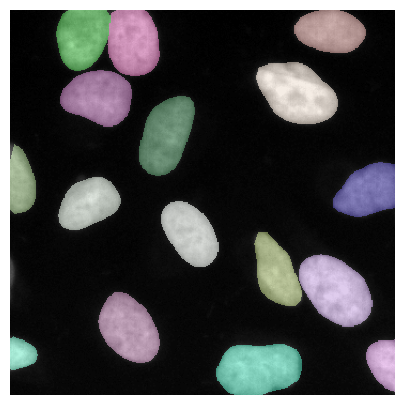

In [ ]:
plt.figure(figsize=(5,5))
plt.imshow(img if img.ndim==2 else img[...,:3], clim=(0,1), cmap='gray')
plt.imshow(labels, cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
plt.axis('off');

## More example results

In [ ]:
def example(model, i, show_dist=True):
    img = normalize(Xt[i], 1,99.8, axis=axis_norm)
    labels, details = model.predict_instances(img)

    plt.figure(figsize=(13,10))
    img_show = img if img.ndim==2 else img[...,:3]
    coord, points, prob = details['coord'], details['points'], details['prob']
    plt.subplot(121); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    a = plt.axis()
    _draw_polygons(coord, points, prob, show_dist=show_dist)
    plt.axis(a)
    plt.subplot(122); plt.imshow(img_show, cmap='gray'); plt.axis('off')
    plt.imshow(labels, cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
    plt.tight_layout()
    plt.show()

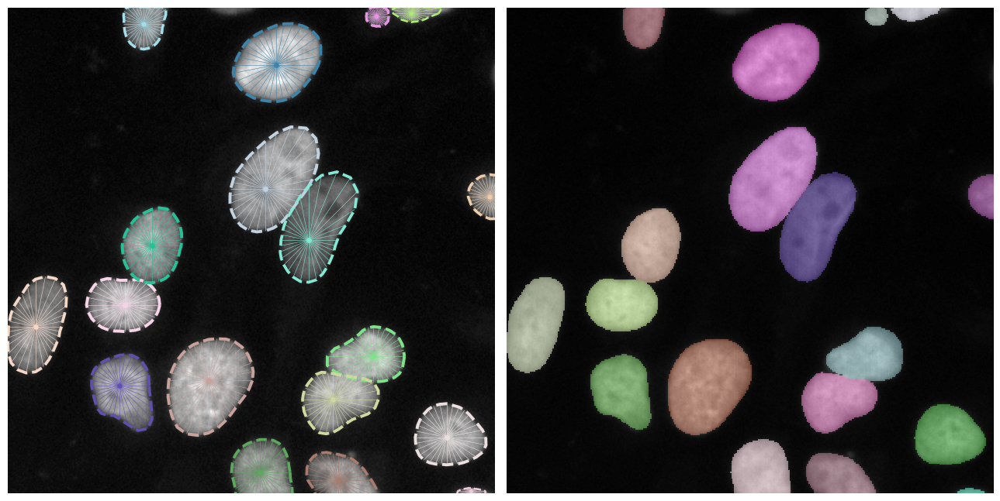

In [ ]:
example(model, 42)

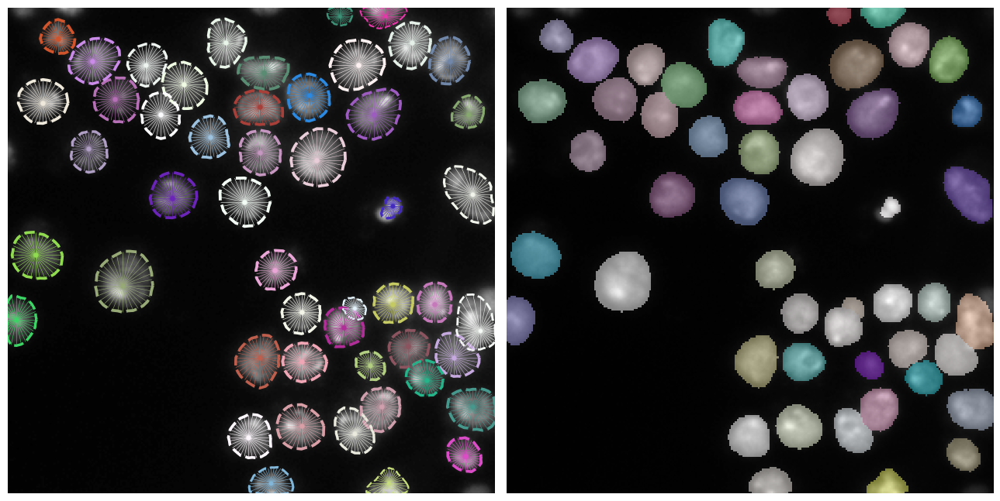

In [ ]:
example(model, 1)

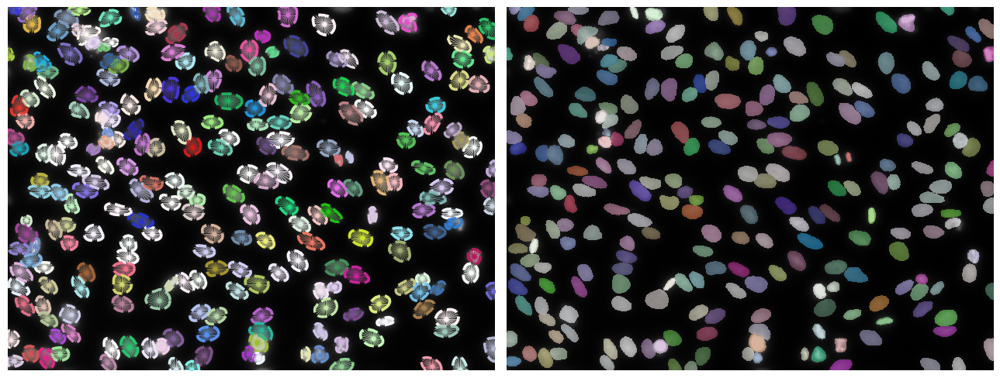

In [ ]:
example(model, 15)

## Evaluation and Detection Performance

Besides the losses and metrics during training, we can also quantitatively evaluate the actual detection/segmentation performance on the validation data by considering objects in the ground truth to be correctly matched if there are predicted objects with overlap (here [intersection over union (IoU)](https://en.wikipedia.org/wiki/Jaccard_index)) beyond a chosen IoU threshold $\tau$.

The corresponding matching statistics (average overlap, accuracy, recall, precision, etc.) are typically of greater practical relevance than the losses/metrics computed during training (but harder to formulate as a loss function).
The value of $\tau$ can be between 0 (even slightly overlapping objects count as correctly predicted) and 1 (only pixel-perfectly overlapping objects count) and which $\tau$ to use depends on the needed segmentation precision/application.

Please see the Wikipedia page on [Sensitivity and specificity](https://en.wikipedia.org/wiki/Sensitivity_and_specificity) for definitions of the abbreviations used in the evaluation below. Note that `mean_true_score` refers to the average overlap (IoU) of all true positives (tp), i.e. correctly predicted objects in terms of the chosen overlap threshold.

First predict the labels for all validation images:

In [ ]:
Y_val_pred = [model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)[0]
              for x in tqdm(X_val)]

100%|██████████| 67/67 [00:10<00:00,  6.43it/s]


Choose several IoU thresholds $\tau$ that might be of interest and for each compute matching statistics for the validation data.

In [ ]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats = [matching_dataset(Y_val, Y_val_pred, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:03<00:00,  2.88it/s]


Example: Print all available matching statistics for $\tau=0.5$

In [ ]:
stats[taus.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=70, tp=2293, fn=250, precision=0.9703766398645789, recall=0.9016909162406607, accuracy=0.8775353999234596, f1=0.9347737464329393, n_true=2543, n_pred=2363, mean_true_score=0.788433729735032, mean_matched_score=0.8743946684327024, panoptic_quality=0.8173611800718249, by_image=False)

Plot the matching statistics and the number of true/false positives/negatives as a function of the IoU threshold $\tau$.

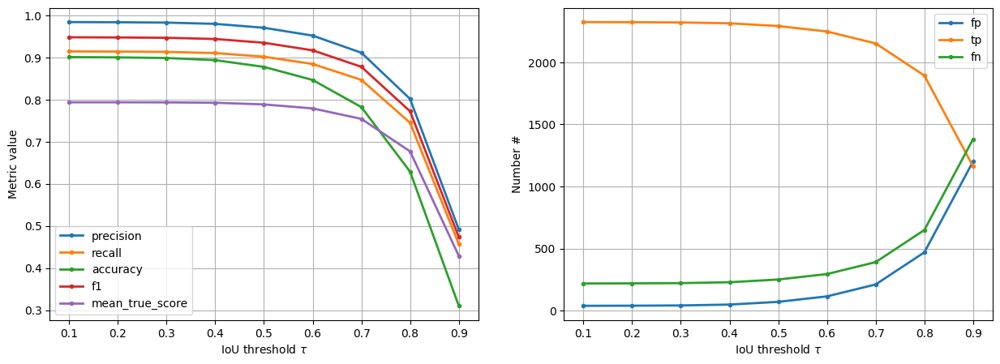

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))

for m in ('precision', 'recall', 'accuracy', 'f1', 'mean_true_score'):
    ax1.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax1.set_xlabel(r'IoU threshold $\tau$')
ax1.set_ylabel('Metric value')
ax1.grid()
ax1.legend()

for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax2.set_xlabel(r'IoU threshold $\tau$')
ax2.set_ylabel('Number #')
ax2.grid()
ax2.legend();

## Export your model to Fiji

# Then this would be identical to a pretrained model that (for instance Matty) can use in fiji, to easily test with new images to see how well it does.

In [ ]:
if not quick_demo:
    model.export_TF()

# **Notes:**
---



1. Tunable Params to look out for:
  - Non-Maxima Suppression
  - Intersection Over Union Threshold (Would set to 0 cause we dont want any overlap!)
2. Hyperparameter tunning is not worth it... StarDist already does alot of smart things internally already.
3. Training data should be a power of 2! 128-256 ect.. however during training this no longer matters as this is internally handled.
4. Make sure the patch size is a multiple of 16 during training.



---

IMPORTANT NOTE: You can annotate bigger images and use a patch size which is smaller and the training will automatically crop patches from that bigger image that you feed it during training.

---




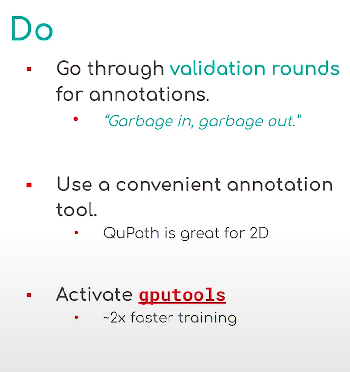

# Training Protocol for QuPath annotation - Pipeline


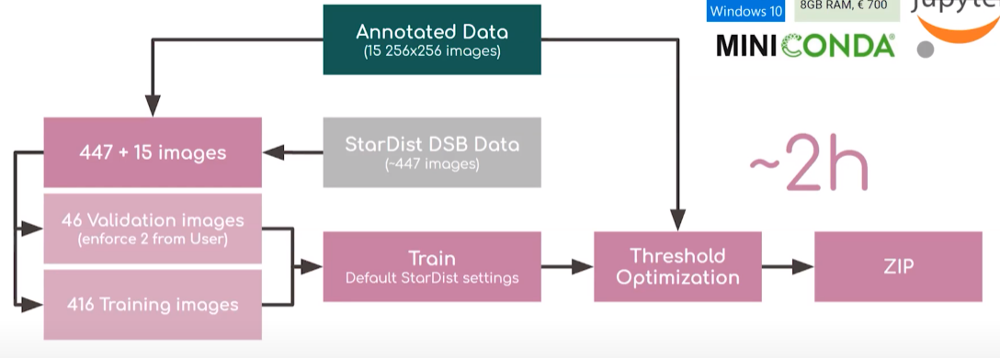